# Сегментация объектов на изображении

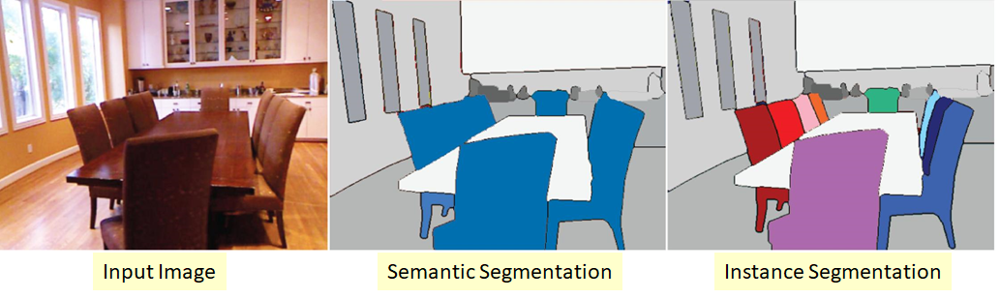

## Semantic Segmentation

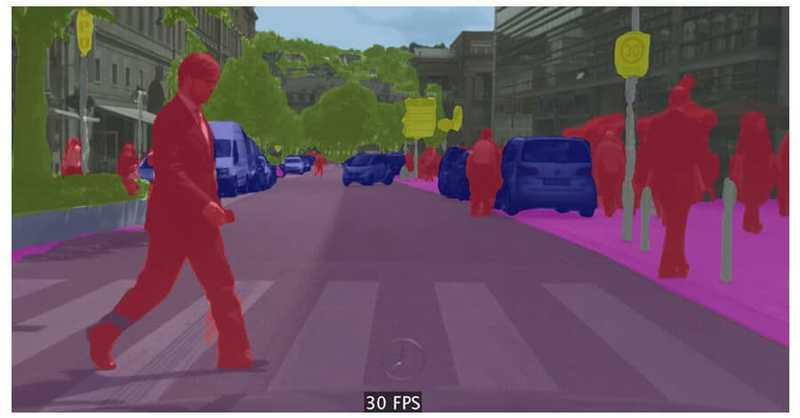

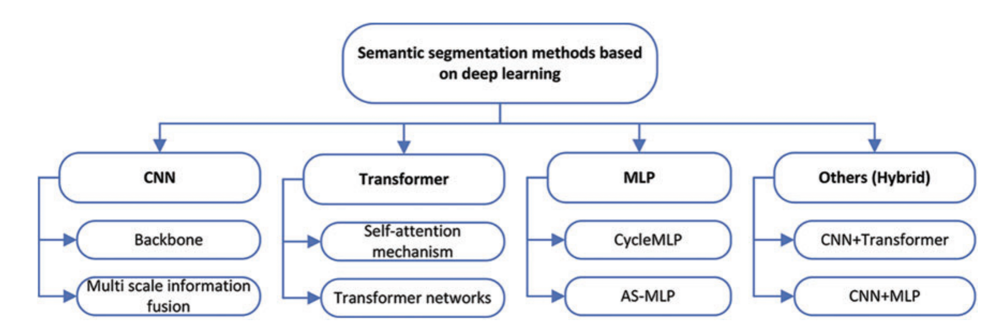

### CNN

#### Unet

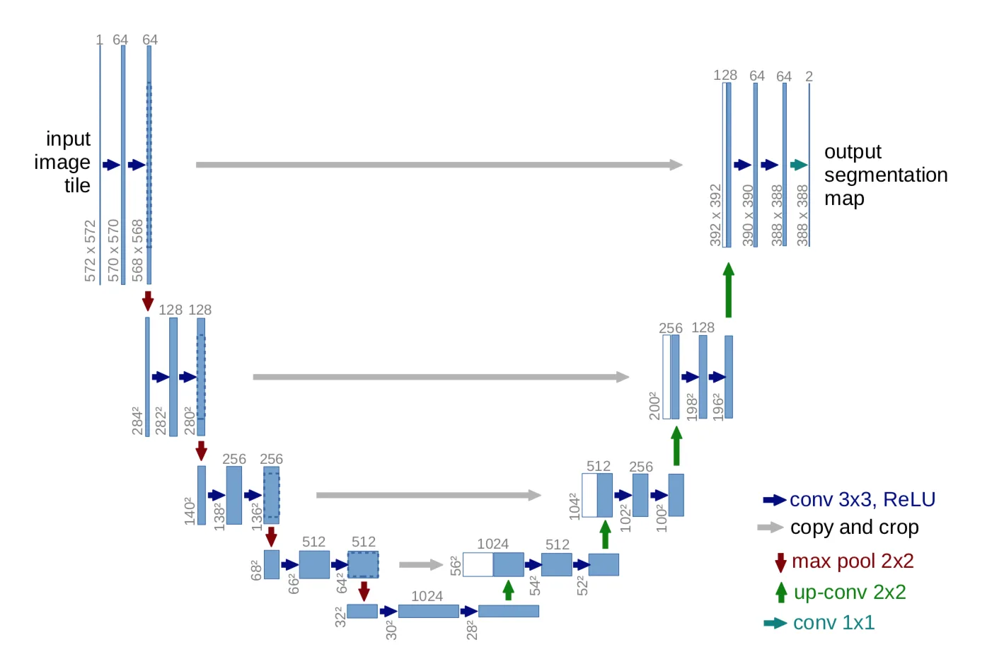

#### Unet++

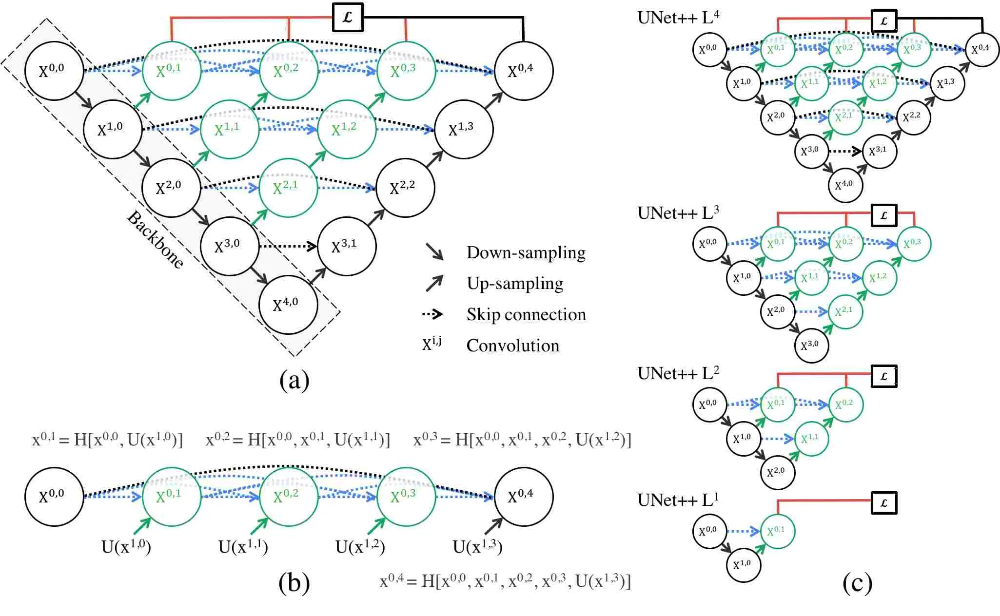

#### LinkNet

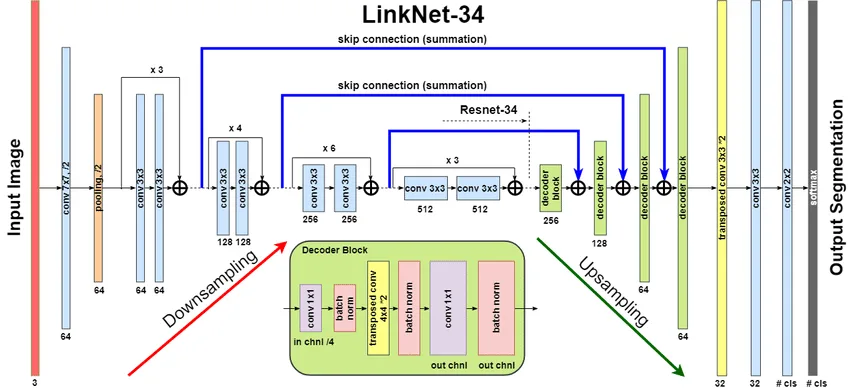

#### DeepLabV3

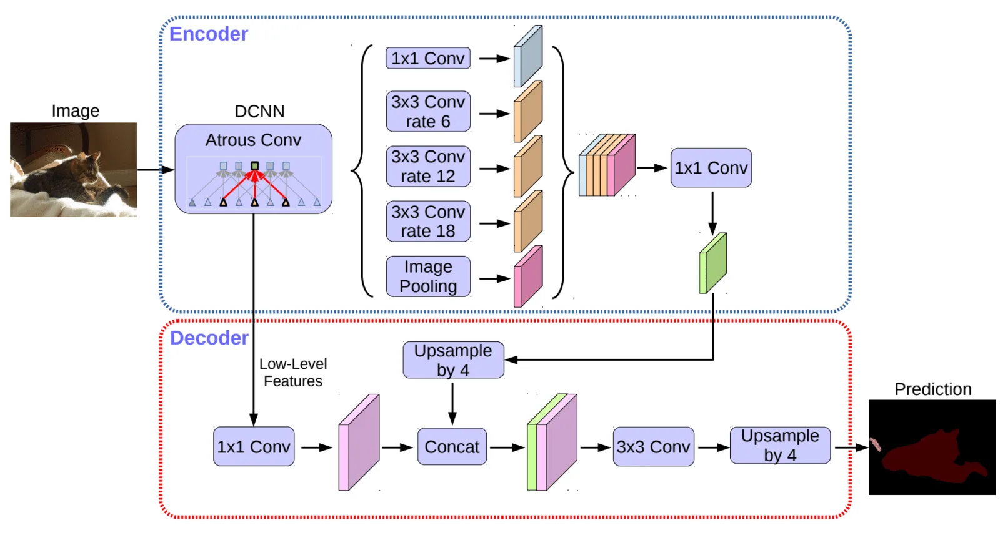

In [1]:
import torch
import segmentation_models_pytorch as smp

model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=2,
)

with torch.no_grad():
    outputs = model(torch.zeros(1, 3, 224, 224))
    print(outputs.shape)

torch.Size([1, 2, 224, 224])


### Transformers

#### SETR

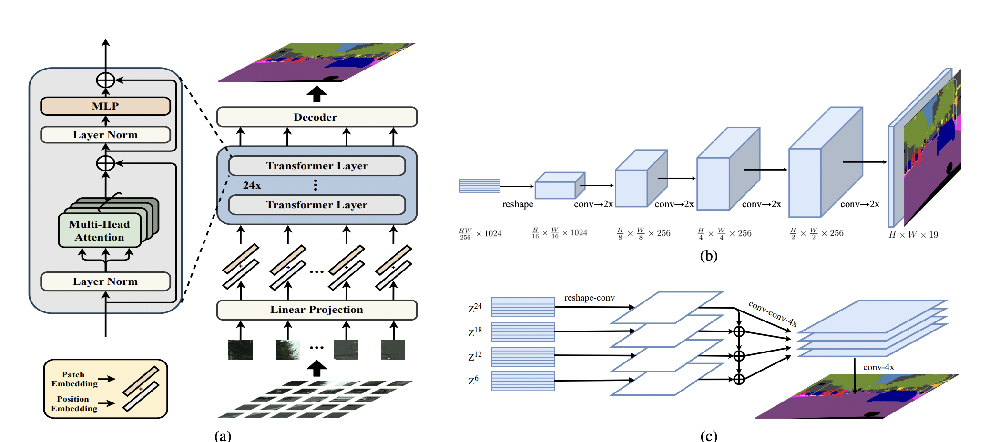

#### SegFormer

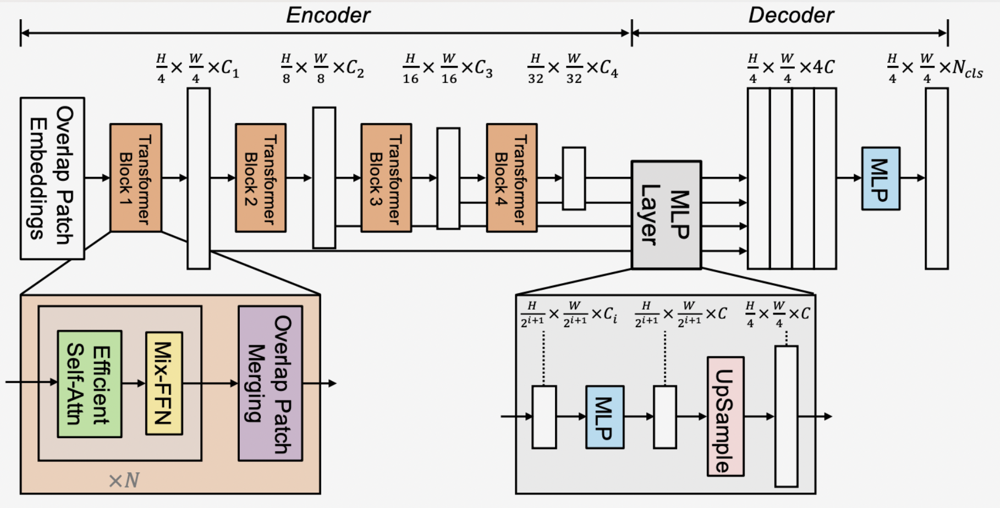

### MLP

#### CycleMLP

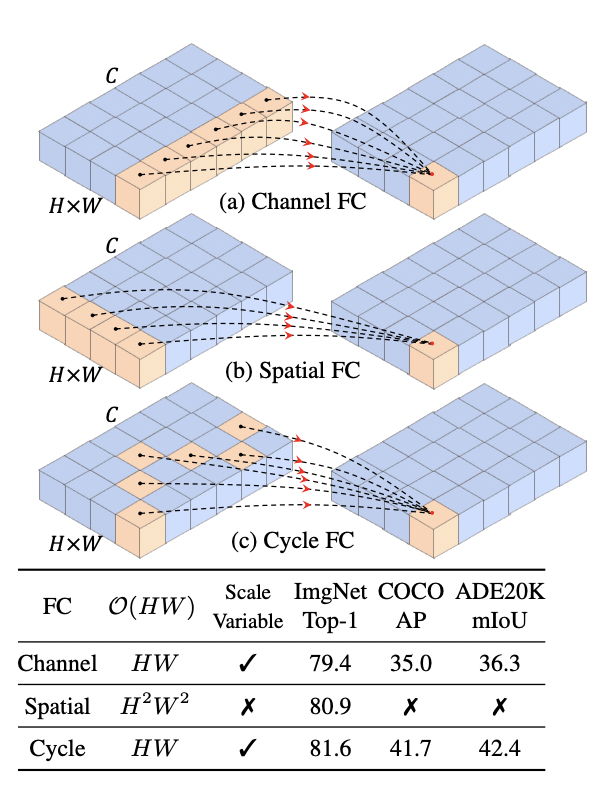

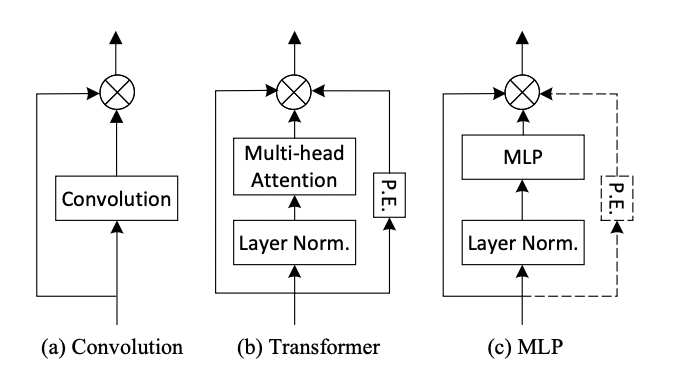

#### AS-MLP

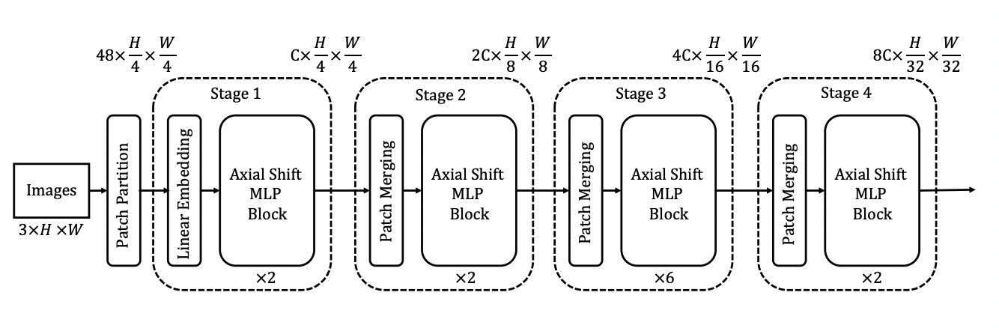

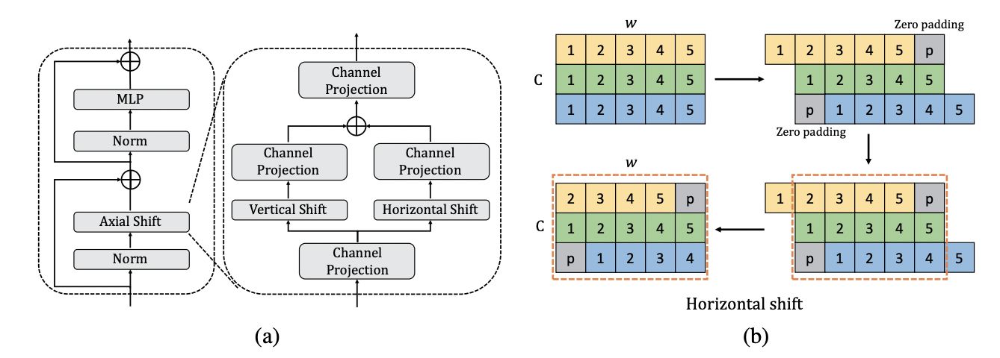

### Hybrid

#### nnFormer

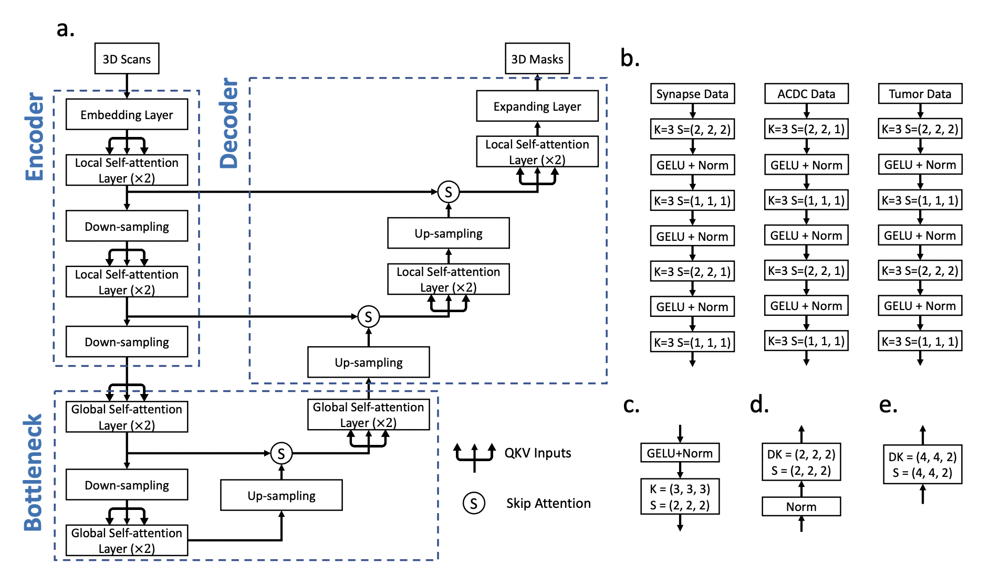

## Instance segmentation

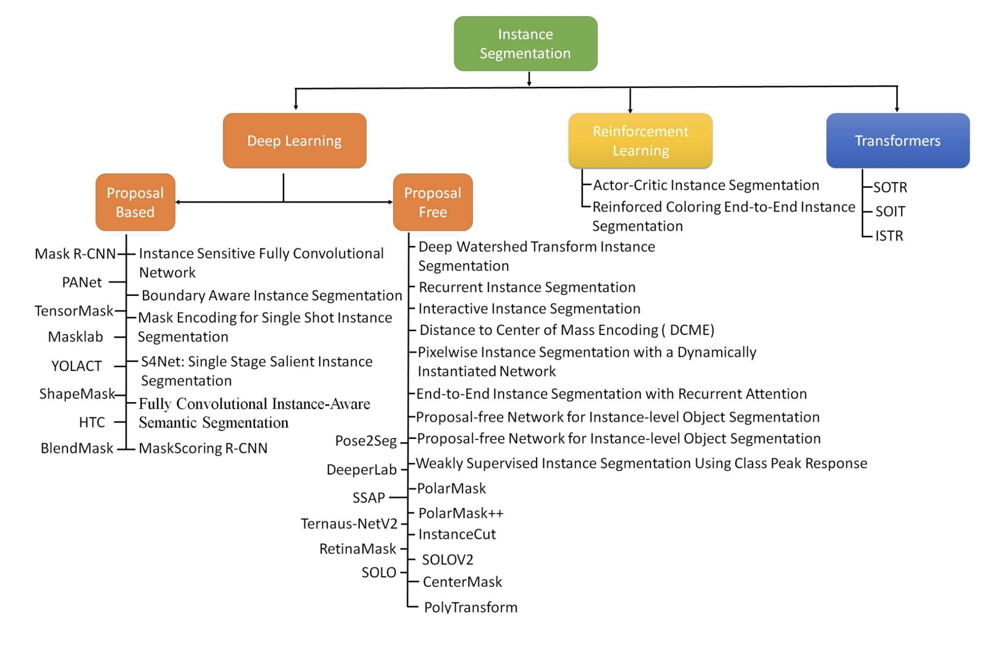

### Proposal based

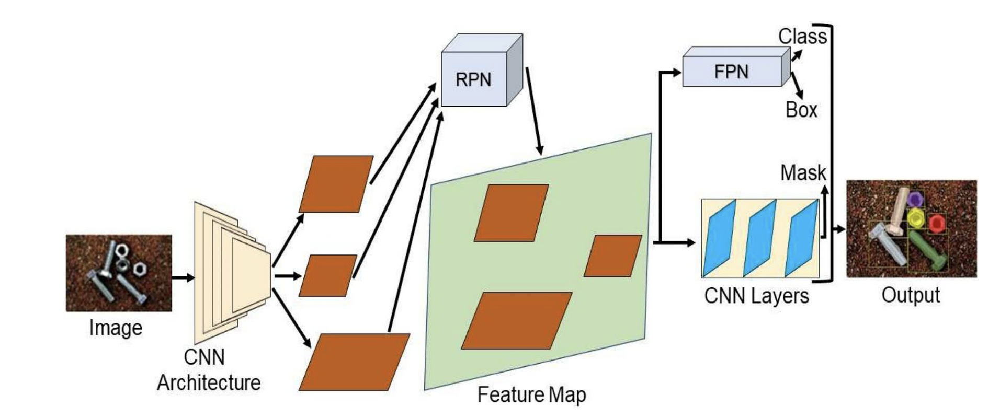

### Proposal free

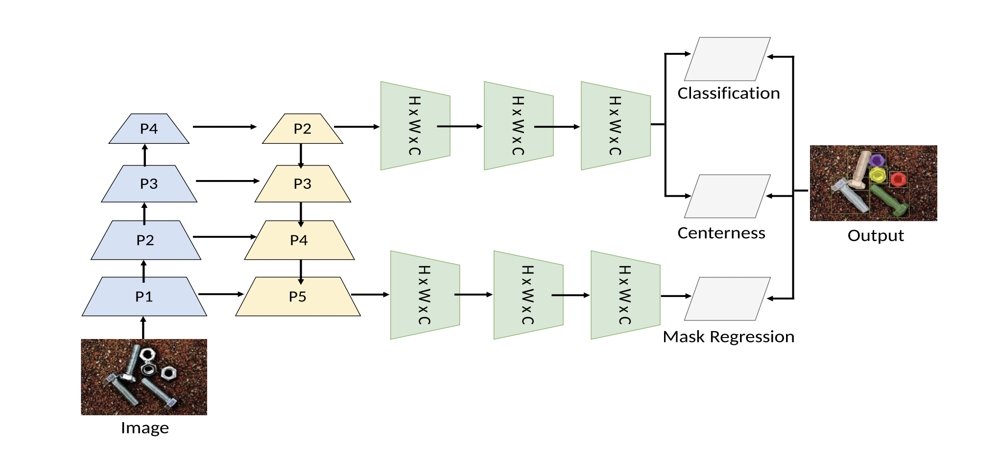

### Actor‑Critic Instance Segmentation

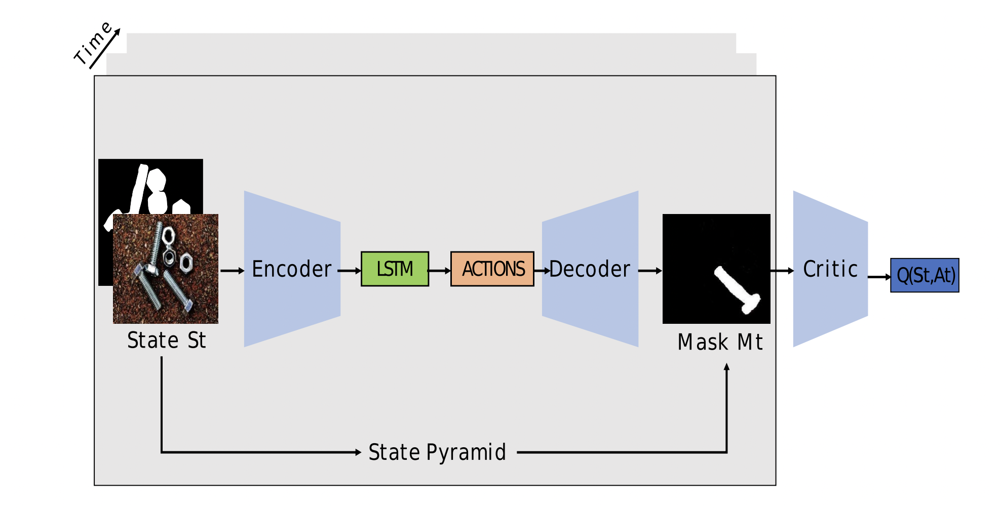

### Transformed based

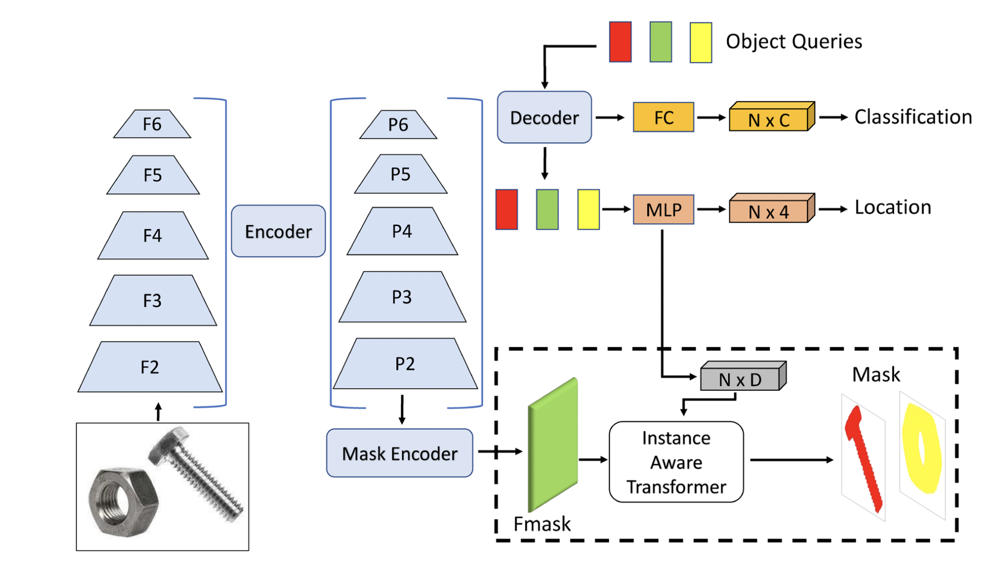

## Как тестировать модели сегментации?

### mAP

Аналогично как с детекцией

### mIOU

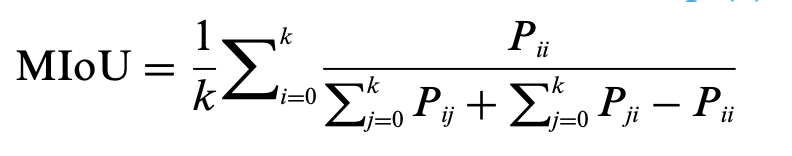

## А как делать upsample?

Например есть транспонированная свертка

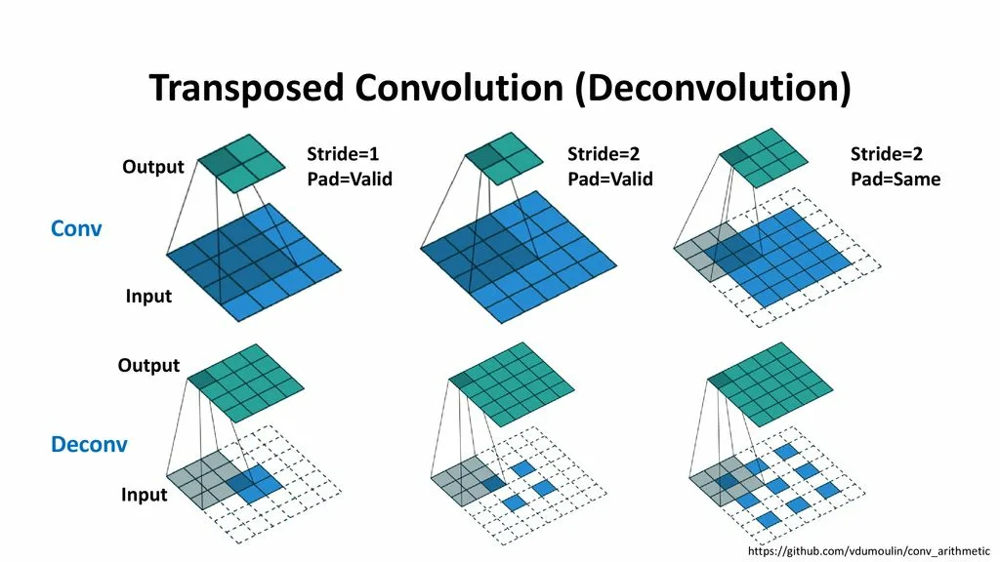

# Code time

In [2]:
import xmltodict
from pathlib import Path
import numpy as np
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
from lightning import Trainer, LightningDataModule, LightningModule
import torch
from torch.utils.data import Dataset, DataLoader

def parse_label(path):
    bbox = xmltodict.parse(open(path, 'r').read())['annotation']['object']['bndbox']
    return np.array(list(map(int, [bbox['xmin'], bbox['ymin'], bbox['xmax'], bbox['ymax']])))


In [93]:
class FishDataset(Dataset):
    def __init__(
        self,
        images,
        labels,
        transform = None
    ):
        self._images = images
        self._labels = labels
        self._transform = transform

    def __len__(self):
        return len(self._labels)

    def __getitem__(self, idx):
        image = np.array(self._images[idx])
        bbox = self._labels[idx].astype('int32')

        h, w, c = image.shape
        mask = torch.zeros(h, w, dtype=torch.long)
        mask[bbox[1]: bbox[3], bbox[0]: bbox[2]] = 1
        if self._transform:
            result = self._transform(image=image, mask=mask.numpy())
            image = result['image']
            mask = result['mask']
        return image, mask.long()


class FishDatasetDistill(Dataset):
    def __init__(
        self,
        images,
        model,
        transform = None
    ):
        self._images = images
        self._transform = transform

        self.model = model

    def __len__(self):
        return len(self._images)

    def __getitem__(self, idx):
        image = np.array(self._images[idx])
        if self._transform:
            result = self._transform(image=image)
            image = result['image']
            with torch.no_grad():
                mask = self.model(image.unsqueeze(0)).squeeze(0).argmax(dim=0)
        return image, mask.long()




In [94]:
class Datamodule(LightningDataModule):
    def __init__(self):
        super().__init__()
        
        images_paths = [str(path) for path in Path('assets/lesson5/train').rglob('*.JPG')]
        self.train_images, scale_factors = [], []
        for image_path in images_paths:
            image = Image.open(image_path)
            old_size = image.size
            new_size = (224, 224)
            scale_factor = (new_size[0] / old_size[0], new_size[1] / old_size[1])
            image = image.resize(new_size)
            self.train_images.append(image)
            scale_factors.append(scale_factor)

        
        self.train_labels = [
            parse_label(path.replace('.JPG', '.xml')) * np.array([scale_factor[0], scale_factor[1], scale_factor[0], scale_factor[1]]) for path, scale_factor  in zip(images_paths, scale_factors)
        ]


        images_paths = [str(path) for path in Path('assets/lesson5/test').rglob('*.JPG')]
        self.test_images, scale_factors = [], []
        for image_path in images_paths:
            image = Image.open(image_path)
            old_size = image.size
            new_size = (224, 224)
            scale_factor = (new_size[0] / old_size[0], new_size[1] / old_size[1])
            image = image.resize(new_size)
            self.test_images.append(image)
            scale_factors.append(scale_factor)

        
        self.test_labels = [
            parse_label(path.replace('.JPG', '.xml')) * np.array([scale_factor[0], scale_factor[1], scale_factor[0], scale_factor[1]]) for path, scale_factor  in zip(images_paths, scale_factors)
        ]

    def train_augmentations(self):
        return A.Compose([
            A.HorizontalFlip(p=0.5),
            A.Resize(224, 224),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2(),
        ])

    def test_augmentations(self):
        return A.Compose([
            A.Resize(224, 224),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2(),
        ])
        
    def setup(self, stage: str, model):
        if stage == 'fit':
            self._train_dataset = FishDatasetDistill(
                images=self.train_images,
                model=model,
                transform=self.train_augmentations()
            )

            self._val_dataset = FishDatasetDistill(
                images=self.test_images,
                model=model,
                transform=self.test_augmentations()
            )

    def train_dataloader(self):
        return torch.utils.data.DataLoader(dataset=self._train_dataset, batch_size=8, shuffle=True, num_workers=0)

    def val_dataloader(self):
        return torch.utils.data.DataLoader(dataset=self._val_dataset, batch_size=8, shuffle=False, num_workers=0) 

In [95]:
class DownsampleConvBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self._conv = torch.nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=1)
        self._relu = torch.nn.ReLU()
        self._norm = torch.nn.BatchNorm2d(num_features=out_channels)
        self._pool = torch.nn.MaxPool2d(kernel_size=2)

    def forward(self, inputs):
        x = inputs
        x = self._conv(x)
        x = self._relu(x)
        x = self._norm(x)
        x = self._pool(x)
        return x

class UpsampleConvBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self._conv = torch.nn.ConvTranspose2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=1)
        self._relu = torch.nn.ReLU()
        self._norm = torch.nn.BatchNorm2d(num_features=out_channels)
        self._pool = torch.nn.Upsample(scale_factor=2)

    def forward(self, inputs):
        x = inputs
        x = self._pool(x)
        x = self._conv(x)
        x = self._relu(x)
        x = self._norm(x)
        return x

class SegmentationModel(torch.nn.Module):
    def __init__(self, num_classes: int = 2):
        super().__init__()
        self.downsample_blocks = torch.nn.ModuleList([
            DownsampleConvBlock(3, 32),
            DownsampleConvBlock(32, 64),
            DownsampleConvBlock(64, 128),
            DownsampleConvBlock(128, 256),
        ])

        self.upsample_blocks = torch.nn.ModuleList([
            UpsampleConvBlock(256, 128),
            UpsampleConvBlock(128, 64),
            UpsampleConvBlock(64, 32),
            UpsampleConvBlock(32, num_classes),
        ])

    def forward(self, x: torch.Tensor):
        inputs = x
        for downsample_block in self.downsample_blocks:
            inputs = downsample_block(inputs)

        for upsample_block in self.upsample_blocks:
            inputs = upsample_block(inputs)
        return inputs


In [96]:
class Learner(LightningModule):
    def __init__(self):
        super().__init__()

        self._model = SegmentationModel(num_classes=2)
        # self._model = smp.Unet(
        #     encoder_name="timm-mobilenetv3_small_075",
        #     encoder_weights="imagenet",
        #     in_channels=3,
        #     classes=2,
        # )
        
        self._loss = torch.nn.CrossEntropyLoss(label_smoothing=0.2)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, self._model.parameters()), lr=3e-4)
        lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.9)
        return [optimizer], [lr_scheduler]

    def training_step(self, batch, batch_idx):
        images, targets = batch
        output = self._model(images)
        loss = self._loss(output, targets.long())
        print(loss)
        return loss

    def validation_step(self, batch, batch_idx):
        images, targets = batch
        output = self._model(images)
        loss = self._loss(output, targets.long())
        
        return loss

    def test_step(self, batch, batch_idx):
        self.validation_step(batch, batch_idx)
        
    def forward(self, inputs):
        return self._model(inputs)

In [97]:
datamodule = Datamodule()

In [98]:
learner = Learner()

trainer = Trainer(max_epochs=10, accelerator='cpu')

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/opt/homebrew/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(


In [99]:
datamodule.setup(stage='fit', model=MODEL)
trainer.fit(model=learner, train_dataloaders=datamodule.train_dataloader(), val_dataloaders=datamodule.val_dataloader())


  | Name   | Type              | Params
---------------------------------------------
0 | _model | SegmentationModel | 777 K 
1 | _loss  | CrossEntropyLoss  | 0     
---------------------------------------------
777 K     Trainable params
0         Non-trainable params
777 K     Total params
3.111     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

/opt/homebrew/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 10 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/opt/homebrew/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 10 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/opt/homebrew/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:281: PossibleUserWarning: The number of training batches (15) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a l

Training: 0it [00:00, ?it/s]

tensor(1.0753, grad_fn=<AddBackward0>)
tensor(0.6516, grad_fn=<AddBackward0>)
tensor(0.5827, grad_fn=<AddBackward0>)
tensor(0.5080, grad_fn=<AddBackward0>)
tensor(0.5406, grad_fn=<AddBackward0>)
tensor(0.5089, grad_fn=<AddBackward0>)
tensor(0.4660, grad_fn=<AddBackward0>)
tensor(0.4927, grad_fn=<AddBackward0>)
tensor(0.4710, grad_fn=<AddBackward0>)
tensor(0.4893, grad_fn=<AddBackward0>)
tensor(0.4635, grad_fn=<AddBackward0>)
tensor(0.4540, grad_fn=<AddBackward0>)
tensor(0.4493, grad_fn=<AddBackward0>)
tensor(0.4424, grad_fn=<AddBackward0>)
tensor(0.4432, grad_fn=<AddBackward0>)


Validation: 0it [00:00, ?it/s]

tensor(0.4483, grad_fn=<AddBackward0>)
tensor(0.4278, grad_fn=<AddBackward0>)
tensor(0.4405, grad_fn=<AddBackward0>)
tensor(0.4286, grad_fn=<AddBackward0>)
tensor(0.4306, grad_fn=<AddBackward0>)
tensor(0.4228, grad_fn=<AddBackward0>)
tensor(0.4262, grad_fn=<AddBackward0>)
tensor(0.4280, grad_fn=<AddBackward0>)
tensor(0.4114, grad_fn=<AddBackward0>)
tensor(0.4161, grad_fn=<AddBackward0>)
tensor(0.4098, grad_fn=<AddBackward0>)
tensor(0.4132, grad_fn=<AddBackward0>)
tensor(0.4165, grad_fn=<AddBackward0>)
tensor(0.4099, grad_fn=<AddBackward0>)
tensor(0.4117, grad_fn=<AddBackward0>)


Validation: 0it [00:00, ?it/s]

tensor(0.4004, grad_fn=<AddBackward0>)
tensor(0.4002, grad_fn=<AddBackward0>)
tensor(0.4058, grad_fn=<AddBackward0>)
tensor(0.4051, grad_fn=<AddBackward0>)
tensor(0.4021, grad_fn=<AddBackward0>)
tensor(0.4187, grad_fn=<AddBackward0>)
tensor(0.3922, grad_fn=<AddBackward0>)
tensor(0.4115, grad_fn=<AddBackward0>)
tensor(0.3983, grad_fn=<AddBackward0>)
tensor(0.4000, grad_fn=<AddBackward0>)
tensor(0.4017, grad_fn=<AddBackward0>)
tensor(0.3990, grad_fn=<AddBackward0>)
tensor(0.3909, grad_fn=<AddBackward0>)
tensor(0.3976, grad_fn=<AddBackward0>)
tensor(0.4026, grad_fn=<AddBackward0>)


Validation: 0it [00:00, ?it/s]

tensor(0.3972, grad_fn=<AddBackward0>)
tensor(0.3868, grad_fn=<AddBackward0>)
tensor(0.3931, grad_fn=<AddBackward0>)
tensor(0.3949, grad_fn=<AddBackward0>)
tensor(0.3937, grad_fn=<AddBackward0>)
tensor(0.3897, grad_fn=<AddBackward0>)
tensor(0.3855, grad_fn=<AddBackward0>)
tensor(0.3860, grad_fn=<AddBackward0>)
tensor(0.3983, grad_fn=<AddBackward0>)
tensor(0.3978, grad_fn=<AddBackward0>)
tensor(0.4045, grad_fn=<AddBackward0>)
tensor(0.3889, grad_fn=<AddBackward0>)
tensor(0.3890, grad_fn=<AddBackward0>)
tensor(0.3996, grad_fn=<AddBackward0>)
tensor(0.3955, grad_fn=<AddBackward0>)


Validation: 0it [00:00, ?it/s]

tensor(0.3968, grad_fn=<AddBackward0>)
tensor(0.4019, grad_fn=<AddBackward0>)
tensor(0.3922, grad_fn=<AddBackward0>)
tensor(0.3868, grad_fn=<AddBackward0>)
tensor(0.3885, grad_fn=<AddBackward0>)
tensor(0.3858, grad_fn=<AddBackward0>)
tensor(0.3880, grad_fn=<AddBackward0>)
tensor(0.3880, grad_fn=<AddBackward0>)
tensor(0.4065, grad_fn=<AddBackward0>)
tensor(0.3867, grad_fn=<AddBackward0>)
tensor(0.3873, grad_fn=<AddBackward0>)
tensor(0.3961, grad_fn=<AddBackward0>)
tensor(0.3863, grad_fn=<AddBackward0>)
tensor(0.3929, grad_fn=<AddBackward0>)
tensor(0.3846, grad_fn=<AddBackward0>)


Validation: 0it [00:00, ?it/s]

tensor(0.3820, grad_fn=<AddBackward0>)
tensor(0.3841, grad_fn=<AddBackward0>)
tensor(0.3840, grad_fn=<AddBackward0>)
tensor(0.3871, grad_fn=<AddBackward0>)
tensor(0.3803, grad_fn=<AddBackward0>)
tensor(0.3951, grad_fn=<AddBackward0>)
tensor(0.3860, grad_fn=<AddBackward0>)
tensor(0.3877, grad_fn=<AddBackward0>)
tensor(0.3900, grad_fn=<AddBackward0>)
tensor(0.3812, grad_fn=<AddBackward0>)
tensor(0.3963, grad_fn=<AddBackward0>)
tensor(0.3821, grad_fn=<AddBackward0>)
tensor(0.3757, grad_fn=<AddBackward0>)
tensor(0.3821, grad_fn=<AddBackward0>)
tensor(0.3865, grad_fn=<AddBackward0>)


Validation: 0it [00:00, ?it/s]

tensor(0.3802, grad_fn=<AddBackward0>)
tensor(0.3816, grad_fn=<AddBackward0>)
tensor(0.3774, grad_fn=<AddBackward0>)
tensor(0.3877, grad_fn=<AddBackward0>)
tensor(0.3791, grad_fn=<AddBackward0>)
tensor(0.3758, grad_fn=<AddBackward0>)
tensor(0.3771, grad_fn=<AddBackward0>)
tensor(0.3759, grad_fn=<AddBackward0>)
tensor(0.3773, grad_fn=<AddBackward0>)
tensor(0.3772, grad_fn=<AddBackward0>)
tensor(0.3876, grad_fn=<AddBackward0>)
tensor(0.3832, grad_fn=<AddBackward0>)
tensor(0.3797, grad_fn=<AddBackward0>)
tensor(0.3802, grad_fn=<AddBackward0>)
tensor(0.3731, grad_fn=<AddBackward0>)


Validation: 0it [00:00, ?it/s]

tensor(0.3712, grad_fn=<AddBackward0>)
tensor(0.3789, grad_fn=<AddBackward0>)
tensor(0.3825, grad_fn=<AddBackward0>)
tensor(0.3923, grad_fn=<AddBackward0>)
tensor(0.3860, grad_fn=<AddBackward0>)
tensor(0.3755, grad_fn=<AddBackward0>)
tensor(0.3758, grad_fn=<AddBackward0>)
tensor(0.3801, grad_fn=<AddBackward0>)
tensor(0.3765, grad_fn=<AddBackward0>)
tensor(0.3699, grad_fn=<AddBackward0>)
tensor(0.3755, grad_fn=<AddBackward0>)
tensor(0.3777, grad_fn=<AddBackward0>)
tensor(0.3787, grad_fn=<AddBackward0>)
tensor(0.3827, grad_fn=<AddBackward0>)
tensor(0.3744, grad_fn=<AddBackward0>)


Validation: 0it [00:00, ?it/s]

tensor(0.3813, grad_fn=<AddBackward0>)
tensor(0.3792, grad_fn=<AddBackward0>)
tensor(0.3721, grad_fn=<AddBackward0>)
tensor(0.3755, grad_fn=<AddBackward0>)
tensor(0.3730, grad_fn=<AddBackward0>)
tensor(0.3726, grad_fn=<AddBackward0>)
tensor(0.3781, grad_fn=<AddBackward0>)
tensor(0.3797, grad_fn=<AddBackward0>)
tensor(0.3740, grad_fn=<AddBackward0>)
tensor(0.3690, grad_fn=<AddBackward0>)
tensor(0.3731, grad_fn=<AddBackward0>)
tensor(0.3707, grad_fn=<AddBackward0>)
tensor(0.3709, grad_fn=<AddBackward0>)
tensor(0.3752, grad_fn=<AddBackward0>)
tensor(0.3818, grad_fn=<AddBackward0>)


Validation: 0it [00:00, ?it/s]

tensor(0.3872, grad_fn=<AddBackward0>)
tensor(0.3677, grad_fn=<AddBackward0>)
tensor(0.3746, grad_fn=<AddBackward0>)
tensor(0.3770, grad_fn=<AddBackward0>)
tensor(0.3702, grad_fn=<AddBackward0>)
tensor(0.3787, grad_fn=<AddBackward0>)
tensor(0.3825, grad_fn=<AddBackward0>)
tensor(0.3767, grad_fn=<AddBackward0>)
tensor(0.3704, grad_fn=<AddBackward0>)
tensor(0.3723, grad_fn=<AddBackward0>)
tensor(0.3654, grad_fn=<AddBackward0>)
tensor(0.3765, grad_fn=<AddBackward0>)
tensor(0.3726, grad_fn=<AddBackward0>)
tensor(0.3775, grad_fn=<AddBackward0>)
tensor(0.3710, grad_fn=<AddBackward0>)


Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.


In [82]:
# from copy import deepcopy

# MODEL = deepcopy(learner._model)

In [100]:
model1 = MODEL
model2 = deepcopy(learner._model)

In [101]:
dataset = datamodule._val_dataset

image, mask = dataset[2]

In [106]:
with torch.no_grad():
    pred = model2(image.unsqueeze(0)).squeeze(0)

In [107]:
pred_mask = pred.max(dim=0)[1]
pred_mask.shape

torch.Size([224, 224])

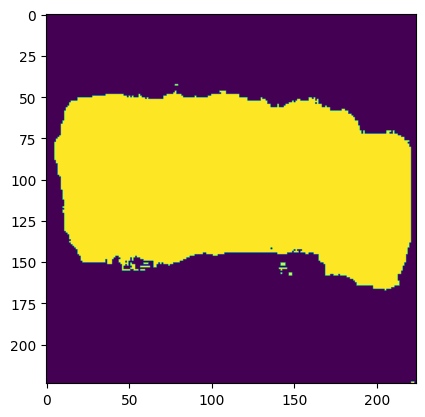

In [108]:
import matplotlib.pyplot as plt

plt.imshow(pred_mask)

In [109]:
# from copy import deepcopy

# dataset = deepcopy(datamodule._val_dataset)
# dataset._transform = None
# image, mask = dataset[2]

# plt.imshow(image)

UnboundLocalError: cannot access local variable 'mask' where it is not associated with a value